In [ ]:
!pip install torch torchvision transformers timm


In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [ ]:
import os

# Paths to images
train_img_path = "/content/drive/MyDrive/Vision_project/trial_DERT_camilo/train_images"
test_img_path = "/content/drive/MyDrive/Vision_project/trial_DERT_camilo/test_images"

# Paths to JSON files
updated_train_json_path = "/content/drive/MyDrive/Vision_project/Flavio_tests/training_box.json"
updated_test_json_path = "/content/drive/MyDrive/Vision_project/Flavio_tests/test_box.json"

# Output label directories
output_train_label_dir = "/content/drive/MyDrive/Vision_project/Trial_yolo_camilo/train/labelTxt"
output_test_label_dir = "/content/drive/MyDrive/Vision_project/Trial_yolo_camilo/test/labelTxt"
output_valid_label_dir = "/content/drive/MyDrive/Vision_project/Trial_yolo_camilo/valid/labelTxt"




# Code for change the image format to apply Ultralytics library

In [ ]:
import shutil
import os
# Define trhee separated folder for train, test and valiadtion sets images.

train_img_path = "/content/drive/MyDrive/Vision_project/trial_DERT_camilo/train_images"
test_img_path = "/content/drive/MyDrive/Vision_project/trial_DERT_camilo/test_images"

train_dest = "/content/drive/MyDrive/Vision_project/Trial_yolo_camilo/train/images"
test_dest = "/content/drive/MyDrive/Vision_project/Trial_yolo_camilo/test/images"
valid_dest = "/content/drive/MyDrive/Vision_project/Trial_yolo_camilo/valid/images"


os.makedirs(train_dest, exist_ok=True)
os.makedirs(test_dest, exist_ok=True)
os.makedirs(valid_dest, exist_ok=True)

for file_name in os.listdir(train_img_path):
    full_source_path = os.path.join(train_img_path, file_name)
    full_destination_path = os.path.join(train_dest, file_name)
    shutil.copy(full_source_path, full_destination_path)

print(f"Copied all files from {train_img_path} to {train_dest}")


for file_name in os.listdir(test_img_path):
    full_source_path = os.path.join(test_img_path, file_name)
    full_destination_path = os.path.join(test_dest, file_name)
    shutil.copy(full_source_path, full_destination_path)

print(f"Copied all files from {test_img_path} to {test_dest}")

for file_name in os.listdir(test_img_path):
    full_source_path = os.path.join(test_img_path, file_name)
    full_destination_path = os.path.join(valid_dest, file_name)
    shutil.copy(full_source_path, full_destination_path)

print(f"Copied all files from {test_img_path} to {valid_dest}")


Copied all files from /content/drive/MyDrive/Vision_project/trial_DERT_camilo/train_images to /content/drive/MyDrive/Vision_project/Trial_yolo_camilo/train/images
Copied all files from /content/drive/MyDrive/Vision_project/trial_DERT_camilo/test_images to /content/drive/MyDrive/Vision_project/Trial_yolo_camilo/test/images
Copied all files from /content/drive/MyDrive/Vision_project/trial_DERT_camilo/test_images to /content/drive/MyDrive/Vision_project/Trial_yolo_camilo/valid/images


In [ ]:
import json
# Convert annotations by nralizing the bounding boxes coordinates
class_map = {"infected": 0, "uninfected": 1}

def convert_json_to_yolo(json_path, output_label_dir):
    with open(json_path, "r") as f:
        data = json.load(f)

    for item in data:
        image_path = item["image"]["pathname"]
        image_name = os.path.basename(image_path).replace(".png", ".txt")
        label_file = os.path.join(output_label_dir, image_name)

        img_height, img_width = item["image"]["shape"]["r"], item["image"]["shape"]["c"]

        with open(label_file, "w") as lf:
            for obj in item["objects"]:
                bbox = obj["bounding_box"]
                category = obj["category"]


                x_min, y_min = bbox["minimum"]["c"], bbox["minimum"]["r"]
                x_max, y_max = bbox["maximum"]["c"], bbox["maximum"]["r"]

                x_center = ((x_min + x_max) / 2) / img_width
                y_center = ((y_min + y_max) / 2) / img_height
                width = (x_max - x_min) / img_width
                height = (y_max - y_min) / img_height


                lf.write(f"{class_map[category]} {x_center:.6f} {y_center:.6f} {width:.6f} {height:.6f}\n")

        print(f"Converted: {image_name}")


convert_json_to_yolo(updated_train_json_path, output_train_label_dir)
convert_json_to_yolo(updated_test_json_path, output_test_label_dir)
convert_json_to_yolo(updated_test_json_path, output_valid_label_dir)

print("Conversion to YOLO format completed.")


Converted: 8d02117d-6c71-4e47-b50a-6cc8d5eb1d55.txt
Converted: 10be6380-cbbb-4886-8b9e-ff56b1710576.txt
Converted: 6b14c855-8561-417c-97a4-63fa552842fd.txt
Converted: 13099edb-35d9-438f-b093-2cf2ebf9d255.txt
Converted: 2559636b-f01a-4414-93da-210c3b12d153.txt
Converted: 0dcca702-a4ef-4fb3-a940-9c0c140b21c7.txt
Converted: 7c66d2fd-68ee-4628-b860-9d7ad25b2a80.txt
Converted: 84c88143-940d-4b62-bbd2-7acc4cadcb6b.txt
Converted: c6d97845-8ad2-4ab7-b385-66613628df5b.txt
Converted: bbf687b5-c6f9-4821-b2e5-a25df1acba47.txt
Converted: f65a1633-9935-4984-a285-a60d30aa1707.txt
Converted: 67acd5bc-4658-4c6e-a9b9-cd8ea3a03418.txt
Converted: 065af549-320a-4862-b92a-8ef750d7b5fb.txt
Converted: e61e6af2-7f8b-47b0-bbe7-acb2ed0299ab.txt
Converted: dcc1a193-7b74-44f8-ad8d-813751d8fa6b.txt
Converted: 27fab82c-5bf0-426f-aeb9-47da829b6629.txt
Converted: c7a2d648-47cb-4b39-afa4-1b7fcfe51934.txt
Converted: dce55b59-c6c3-4693-aa75-6b348c8f52cd.txt
Converted: a8cb75ba-3f2f-40d8-8bc7-c79ebd1b9603.txt
Converted: 6

In [ ]:
import os

# Cahnge iamge and annotations names due to problems in the coplilation
image_dir = "/content/drive/MyDrive/Vision_project/Trial_yolo_camilo/train/images"
label_dir = "/content/drive/MyDrive/Vision_project/Trial_yolo_camilo/train/labelTxt"


image_files = sorted([f for f in os.listdir(image_dir) if f.endswith(('.png', '.jpg', '.jpeg'))])
label_files = sorted([f for f in os.listdir(label_dir) if f.endswith('.txt')])

if len(image_files) != len(label_files):
    print(f"Mismatch: {len(image_files)} images and {len(label_files)} labels.")
else:
    for idx, (image_file, label_file) in enumerate(zip(image_files, label_files)):

        old_image_path = os.path.join(image_dir, image_file)
        old_label_path = os.path.join(label_dir, label_file)

        new_image_name = f"{idx}.png"
        new_label_name = f"{idx}.txt"
        new_image_path = os.path.join(image_dir, new_image_name)
        new_label_path = os.path.join(label_dir, new_label_name)


        os.rename(old_image_path, new_image_path)
        os.rename(old_label_path, new_label_path)

        print(f"Renamed: {image_file} -> {new_image_name}, {label_file} -> {new_label_name}")

    print("Renaming completed successfully!")


Renamed: 002f20ad-2ace-499c-9335-c9080bc3e6b5.png -> 0.png, 002f20ad-2ace-499c-9335-c9080bc3e6b5.txt -> 0.txt
Renamed: 003a89b0-a095-417a-8dd6-f408339bbc68.png -> 1.png, 003a89b0-a095-417a-8dd6-f408339bbc68.txt -> 1.txt
Renamed: 003d1cdc-0aec-430b-90e0-f4d82135b1ac.png -> 2.png, 003d1cdc-0aec-430b-90e0-f4d82135b1ac.txt -> 2.txt
Renamed: 005e60b6-77b8-458c-b57c-bfe0c7e7df78.png -> 3.png, 005e60b6-77b8-458c-b57c-bfe0c7e7df78.txt -> 3.txt
Renamed: 00a02700-2ea2-4590-9e15-ffc9160fd3de.png -> 4.png, 00a02700-2ea2-4590-9e15-ffc9160fd3de.txt -> 4.txt
Renamed: 00c8364b-8c85-4502-bcfe-64736fe76815.png -> 5.png, 00c8364b-8c85-4502-bcfe-64736fe76815.txt -> 5.txt
Renamed: 00d04a90-80e5-4bce-9511-1b64eabb7a47.png -> 6.png, 00d04a90-80e5-4bce-9511-1b64eabb7a47.txt -> 6.txt
Renamed: 0154dd8e-72f8-4d78-a4dd-93e139577bd1.png -> 7.png, 0154dd8e-72f8-4d78-a4dd-93e139577bd1.txt -> 7.txt
Renamed: 01b38a56-13eb-447b-89ee-fc21cb40dcc1.png -> 8.png, 01b38a56-13eb-447b-89ee-fc21cb40dcc1.txt -> 8.txt
Renamed: 0

In [ ]:
import os


image_dir = "/content/drive/MyDrive/Vision_project/Trial_yolo_camilo/test/images"
label_dir = "/content/drive/MyDrive/Vision_project/Trial_yolo_camilo/test/labelTxt"


image_files = sorted([f for f in os.listdir(image_dir) if f.endswith(('.png', '.jpg', '.jpeg'))])
label_files = sorted([f for f in os.listdir(label_dir) if f.endswith('.txt')])


if len(image_files) != len(label_files):
    print(f"Mismatch: {len(image_files)} images and {len(label_files)} labels.")
else:

    for idx, (image_file, label_file) in enumerate(zip(image_files, label_files)):

        old_image_path = os.path.join(image_dir, image_file)
        old_label_path = os.path.join(label_dir, label_file)


        new_image_name = f"{idx}.png"
        new_label_name = f"{idx}.txt"
        new_image_path = os.path.join(image_dir, new_image_name)
        new_label_path = os.path.join(label_dir, new_label_name)


        os.rename(old_image_path, new_image_path)
        os.rename(old_label_path, new_label_path)

        print(f"Renamed: {image_file} -> {new_image_name}, {label_file} -> {new_label_name}")

    print("Renaming completed successfully!")


Renamed: 010961af-b38c-49de-aca0-e3732d73d414.png -> 0.png, 010961af-b38c-49de-aca0-e3732d73d414.txt -> 0.txt
Renamed: 0346611b-ea43-45bd-9f16-c6e8086273d2.png -> 1.png, 0346611b-ea43-45bd-9f16-c6e8086273d2.txt -> 1.txt
Renamed: 03be08c8-2cf3-4de6-8ac6-5f7817a6a643.png -> 2.png, 03be08c8-2cf3-4de6-8ac6-5f7817a6a643.txt -> 2.txt
Renamed: 06bbcd42-3ba8-4476-8804-8455f56dd928.png -> 3.png, 06bbcd42-3ba8-4476-8804-8455f56dd928.txt -> 3.txt
Renamed: 0864c569-2ad7-48ed-b12a-e40aa5b93756.png -> 4.png, 0864c569-2ad7-48ed-b12a-e40aa5b93756.txt -> 4.txt
Renamed: 087602a2-288b-4a4d-b01a-524f0d799d89.png -> 5.png, 087602a2-288b-4a4d-b01a-524f0d799d89.txt -> 5.txt
Renamed: 0897f682-5301-49fc-a8d5-9df7762040bb.png -> 6.png, 0897f682-5301-49fc-a8d5-9df7762040bb.txt -> 6.txt
Renamed: 0a3b53c7-e7ab-4135-80aa-fd2079d727d6.png -> 7.png, 0a3b53c7-e7ab-4135-80aa-fd2079d727d6.txt -> 7.txt
Renamed: 0e0bc36f-6fb2-4763-b0a1-b4c67b2d2d2a.png -> 8.png, 0e0bc36f-6fb2-4763-b0a1-b4c67b2d2d2a.txt -> 8.txt
Renamed: 1

In [ ]:
import os


image_dir = "/content/drive/MyDrive/Vision_project/Trial_yolo_camilo/valid/images"
label_dir = "/content/drive/MyDrive/Vision_project/Trial_yolo_camilo/valid/labelTxt"


image_files = sorted([f for f in os.listdir(image_dir) if f.endswith(('.png', '.jpg', '.jpeg'))])
label_files = sorted([f for f in os.listdir(label_dir) if f.endswith('.txt')])

if len(image_files) != len(label_files):
    print(f"Mismatch: {len(image_files)} images and {len(label_files)} labels.")
else:

    for idx, (image_file, label_file) in enumerate(zip(image_files, label_files)):

        old_image_path = os.path.join(image_dir, image_file)
        old_label_path = os.path.join(label_dir, label_file)

        new_image_name = f"{idx}.png"
        new_label_name = f"{idx}.txt"
        new_image_path = os.path.join(image_dir, new_image_name)
        new_label_path = os.path.join(label_dir, new_label_name)

        os.rename(old_image_path, new_image_path)
        os.rename(old_label_path, new_label_path)

        print(f"Renamed: {image_file} -> {new_image_name}, {label_file} -> {new_label_name}")

    print("Renaming completed successfully!")


Renamed: 010961af-b38c-49de-aca0-e3732d73d414.png -> 0.png, 010961af-b38c-49de-aca0-e3732d73d414.txt -> 0.txt
Renamed: 0346611b-ea43-45bd-9f16-c6e8086273d2.png -> 1.png, 0346611b-ea43-45bd-9f16-c6e8086273d2.txt -> 1.txt
Renamed: 03be08c8-2cf3-4de6-8ac6-5f7817a6a643.png -> 2.png, 03be08c8-2cf3-4de6-8ac6-5f7817a6a643.txt -> 2.txt
Renamed: 06bbcd42-3ba8-4476-8804-8455f56dd928.png -> 3.png, 06bbcd42-3ba8-4476-8804-8455f56dd928.txt -> 3.txt
Renamed: 0864c569-2ad7-48ed-b12a-e40aa5b93756.png -> 4.png, 0864c569-2ad7-48ed-b12a-e40aa5b93756.txt -> 4.txt
Renamed: 087602a2-288b-4a4d-b01a-524f0d799d89.png -> 5.png, 087602a2-288b-4a4d-b01a-524f0d799d89.txt -> 5.txt
Renamed: 0897f682-5301-49fc-a8d5-9df7762040bb.png -> 6.png, 0897f682-5301-49fc-a8d5-9df7762040bb.txt -> 6.txt
Renamed: 0a3b53c7-e7ab-4135-80aa-fd2079d727d6.png -> 7.png, 0a3b53c7-e7ab-4135-80aa-fd2079d727d6.txt -> 7.txt
Renamed: 0e0bc36f-6fb2-4763-b0a1-b4c67b2d2d2a.png -> 8.png, 0e0bc36f-6fb2-4763-b0a1-b4c67b2d2d2a.txt -> 8.txt
Renamed: 1

# Trainning code

In [ ]:
!pip install ultralytics


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 913.6/913.6 kB 23.0 MB/s eta 0:00:00


In [ ]:
from ultralytics import YOLO

# Load a YOLOv8 pre-trained model
model = YOLO("yolov8m.pt")

# Train the model
model.train(data="/content/drive/MyDrive/Vision_project/Trial_yolo_camilo/config.yaml", epochs=20, imgsz=640, batch=16, box=7.5,
            cls=3.0,
            kobj=1.0,
            pretrained="/content/drive/MyDrive/Vision_project/Trial_yolo_camilo/saved_models/best_m.pt")


Ultralytics 8.3.68 🚀 Python-3.11.11 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8m.pt, data=/content/drive/MyDrive/Vision_project/Trial_yolo_camilo/config.yaml, epochs=20, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train2, exist_ok=False, pretrained=/content/drive/MyDrive/Vision_project/Trial_yolo_camilo/saved_models/best_m.pt, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=Fals

train: Scanning /content/drive/MyDrive/Vision_project/Trial_yolo_camilo/train/labels.cache... 1208 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1208/1208 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/drive/MyDrive/Vision_project/Trial_yolo_camilo/valid/labels.cache... 120 images, 0 backgrounds, 0 corrupt: 100%|██████████| 120/120 [00:00<?, ?it/s]


Plotting labels to runs/detect/train2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train2
Starting training for 20 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/20      12.4G     0.9471      5.595      1.017       1242        640: 100%|██████████| 76/76 [04:02<00:00,  3.19s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:08<00:00,  2.23s/it]

                   all        120       5917      0.822      0.796      0.859      0.677



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/20        13G      0.823      2.726      0.943        731        640: 100%|██████████| 76/76 [01:37<00:00,  1.29s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.15it/s]

                   all        120       5917      0.154      0.417      0.254      0.185



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/20      12.6G     0.8664      2.684     0.9522        904        640: 100%|██████████| 76/76 [01:36<00:00,  1.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:04<00:00,  1.11s/it]

                   all        120       5917      0.813      0.728      0.796      0.622



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/20      12.2G     0.8479      2.666     0.9478        881        640: 100%|██████████| 76/76 [01:38<00:00,  1.30s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.33it/s]

                   all        120       5917      0.788      0.743      0.759      0.608



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/20      9.91G     0.8202        2.5     0.9364       1142        640: 100%|██████████| 76/76 [01:37<00:00,  1.29s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.32it/s]

                   all        120       5917      0.805      0.775      0.851      0.698



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/20      10.4G      0.791      2.332     0.9265       1005        640: 100%|██████████| 76/76 [01:35<00:00,  1.26s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:04<00:00,  1.19s/it]

                   all        120       5917      0.854      0.803       0.85      0.698



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/20      10.7G      0.772      2.251     0.9236        531        640: 100%|██████████| 76/76 [01:37<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.35it/s]

                   all        120       5917      0.816      0.793      0.871      0.692



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/20      10.4G     0.7813      2.265     0.9207        960        640: 100%|██████████| 76/76 [01:38<00:00,  1.29s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.33it/s]

                   all        120       5917      0.849      0.771      0.858      0.702



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/20        11G     0.7785      2.219      0.921       1143        640: 100%|██████████| 76/76 [01:36<00:00,  1.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:04<00:00,  1.20s/it]

                   all        120       5917      0.822        0.8       0.84      0.697



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/20      11.6G     0.7516      2.111     0.9149        859        640: 100%|██████████| 76/76 [01:36<00:00,  1.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.25it/s]

                   all        120       5917      0.678      0.806      0.792      0.657


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/20      8.38G     0.7527      2.114      0.935        479        640: 100%|██████████| 76/76 [01:41<00:00,  1.34s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:04<00:00,  1.06s/it]

                   all        120       5917      0.847       0.83      0.885      0.731



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/20      9.46G     0.7625      2.115     0.9391        476        640: 100%|██████████| 76/76 [01:33<00:00,  1.23s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:04<00:00,  1.25s/it]

                   all        120       5917      0.832      0.901      0.873      0.733



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/20      8.07G     0.7456      2.046     0.9265        313        640: 100%|██████████| 76/76 [01:37<00:00,  1.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.25it/s]

                   all        120       5917      0.707        0.8      0.798      0.655



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/20      9.18G      0.742      1.997     0.9306        525        640: 100%|██████████| 76/76 [01:35<00:00,  1.25s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.50it/s]

                   all        120       5917      0.866      0.759       0.86      0.722



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/20      11.1G     0.7394      1.985     0.9267        647        640: 100%|██████████| 76/76 [01:35<00:00,  1.25s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:04<00:00,  1.12s/it]

                   all        120       5917      0.865      0.763      0.856      0.712



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/20      8.78G     0.7285      1.935     0.9233        519        640: 100%|██████████| 76/76 [01:32<00:00,  1.21s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:04<00:00,  1.06s/it]

                   all        120       5917      0.852      0.727      0.842      0.698



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/20      9.89G     0.7225      1.914     0.9214        543        640: 100%|██████████| 76/76 [01:34<00:00,  1.24s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.38it/s]

                   all        120       5917      0.645      0.868      0.799      0.665



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/20      9.17G     0.7148      1.873     0.9128        490        640: 100%|██████████| 76/76 [01:33<00:00,  1.24s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.43it/s]

                   all        120       5917      0.638      0.906      0.825      0.695



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/20      9.36G     0.7051      1.833     0.9155        378        640: 100%|██████████| 76/76 [01:34<00:00,  1.24s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.48it/s]

                   all        120       5917      0.651      0.889       0.82      0.689



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/20      10.7G     0.7057      1.818     0.9155        445        640: 100%|██████████| 76/76 [01:34<00:00,  1.24s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.29it/s]

                   all        120       5917      0.687      0.898      0.835      0.705



20 epochs completed in 0.626 hours.
Optimizer stripped from runs/detect/train2/weights/last.pt, 52.0MB
Optimizer stripped from runs/detect/train2/weights/best.pt, 52.0MB

Validating runs/detect/train2/weights/best.pt...
Ultralytics 8.3.68 🚀 Python-3.11.11 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 218 layers, 25,840,918 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:11<00:00,  2.87s/it]


                   all        120       5917      0.833      0.902      0.872      0.732
              infected        115        303      0.731      0.825      0.763      0.625
            uninfected        120       5614      0.935      0.979      0.982      0.839
Speed: 0.4ms preprocess, 11.0ms inference, 0.0ms loss, 5.5ms postprocess per image
Results saved to runs/detect/train2


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x788a905c9610>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.04804

# Save and load the model

In [ ]:
model.save("/content/drive/MyDrive/Vision_project/Trial_yolo_camilo/saved_models/best_plus.pt")

In [ ]:
from ultralytics import YOLO

model = YOLO("/content/drive/MyDrive/Vision_project/Trial_yolo_camilo/saved_models/best_m.pt")


In [ ]:
# Tria wit only one image for the inference
test_image_path = "/content/drive/MyDrive/Vision_project/Trial_yolo_camilo/test/images/1.png"  #

results = model(test_image_path)



image 1/1 /content/drive/MyDrive/Vision_project/Trial_yolo_camilo/test/images/1.png: 480x640 1 infected, 62 uninfecteds, 53.2ms
Speed: 18.6ms preprocess, 53.2ms inference, 1064.5ms postprocess per image at shape (1, 3, 480, 640)



image 1/1 /content/drive/MyDrive/Vision_project/Trial_yolo_camilo/test/images/1.png: 480x640 1 infected, 62 uninfecteds, 6.5ms
Speed: 2.8ms preprocess, 6.5ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)


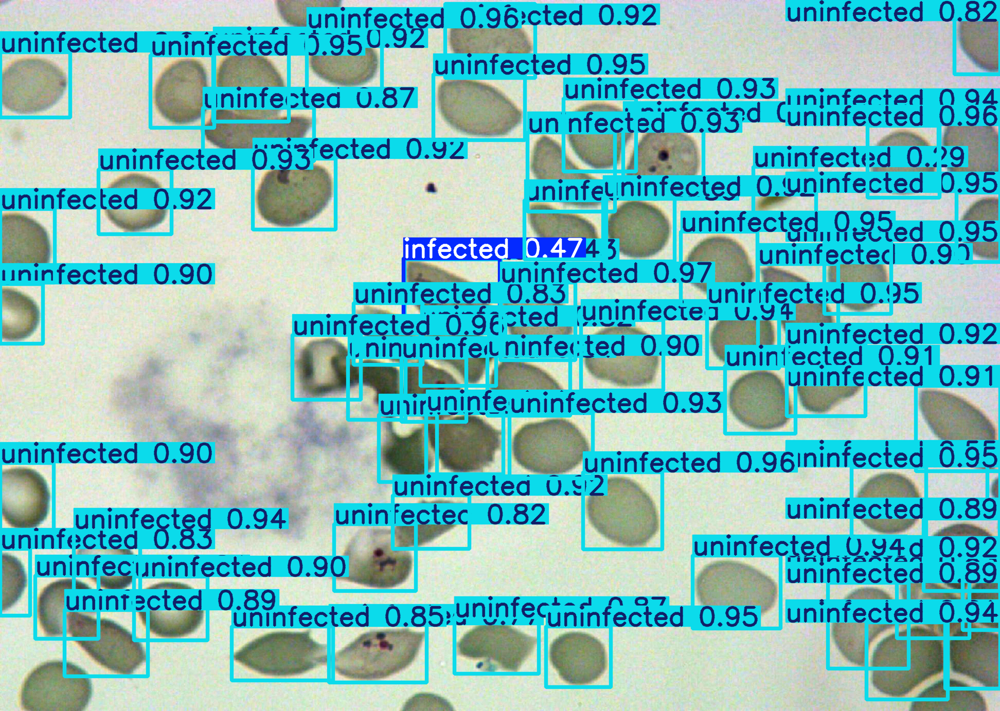

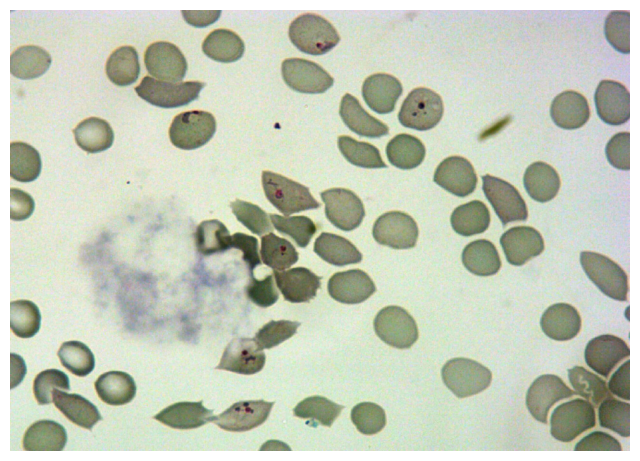

In [ ]:
import cv2
import matplotlib.pyplot as plt


test_image_path = "/content/drive/MyDrive/Vision_project/Trial_yolo_camilo/test/images/1.png"

results = model(test_image_path)

img = cv2.imread(test_image_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)


plt.figure(figsize=(8, 6))
plt.imshow(img)
plt.axis("off")

# detections
results[0].show()
plt.show()


# Code to visualize multiple predictions


image 1/1 /content/drive/MyDrive/Vision_project/Trial_yolo_camilo/test/images/0.png: 480x640 4 infecteds, 67 uninfecteds, 7.0ms
Speed: 2.6ms preprocess, 7.0ms inference, 1.2ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /content/drive/MyDrive/Vision_project/Trial_yolo_camilo/test/images/1.png: 480x640 1 infected, 62 uninfecteds, 6.3ms
Speed: 2.6ms preprocess, 6.3ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /content/drive/MyDrive/Vision_project/Trial_yolo_camilo/test/images/10.png: 480x640 1 infected, 49 uninfecteds, 7.0ms
Speed: 2.6ms preprocess, 7.0ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /content/drive/MyDrive/Vision_project/Trial_yolo_camilo/test/images/100.png: 480x640 3 infecteds, 55 uninfecteds, 8.3ms
Speed: 2.6ms preprocess, 8.3ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /content/drive/MyDrive/Vision_project/Trial_yolo_camilo/test/images/101.png: 480x640 3 i

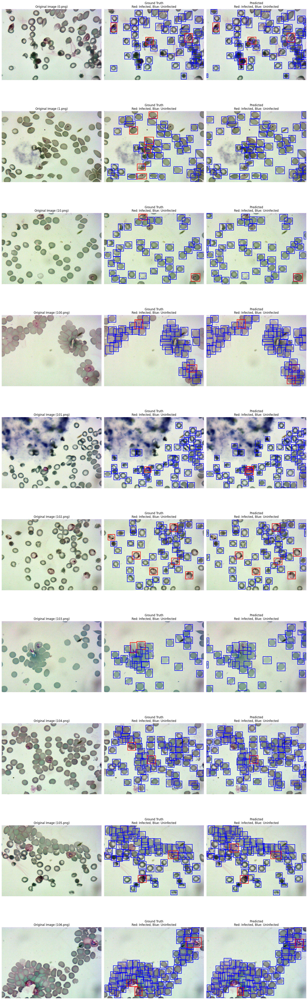

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from ultralytics import YOLO

# Load the model
model_path = "/content/drive/MyDrive/Vision_project/Trial_yolo_camilo/saved_models/best.pt"
model = YOLO(model_path)

test_images_dir = "/content/drive/MyDrive/Vision_project/Trial_yolo_camilo/test/images"
test_labels_dir = "/content/drive/MyDrive/Vision_project/Trial_yolo_camilo/test/labels"


image_files = sorted([f for f in os.listdir(test_images_dir) if f.endswith(".png") or f.endswith(".jpg")])


num_images = 10


selected_images = image_files[:num_images]

# Create figure with subplots for each image
fig, axes = plt.subplots(num_images, 3, figsize=(18, 6 * num_images))

for i, img_filename in enumerate(selected_images):
    img_path = os.path.join(test_images_dir, img_filename)
    label_file = os.path.join(test_labels_dir, img_filename.replace(".png", ".txt").replace(".jpg", ".txt"))

    # Load the original image and run inference
    original_img = cv2.imread(img_path)
    original_img = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)
    orig_h, orig_w = original_img.shape[:2]

    results = model(img_path)

    yolo_resized_h, yolo_resized_w = results[0].orig_shape

    # Extract predictions fromt he model results
    if len(results[0].boxes) > 0:
        pred_boxes = results[0].boxes.xyxy.cpu().numpy()
        pred_classes = results[0].boxes.cls.cpu().numpy().astype(int)
    else:
        pred_boxes = []
        pred_classes = []

    # Compute scaling to convert boxes to oroginal scale of absoulte pixel value
    scale_x = orig_w / yolo_resized_w
    scale_y = orig_h / yolo_resized_h

    for j in range(len(pred_boxes)):
        pred_boxes[j][0] *= scale_x
        pred_boxes[j][1] *= scale_y
        pred_boxes[j][2] *= scale_x
        pred_boxes[j][3] *= scale_y

    # Load ground truth labels and convert YOLO format to absolute pixel coordinates
    gt_boxes = []
    gt_classes = []

    if os.path.exists(label_file):
        with open(label_file, "r") as f:
            for line in f.readlines():
                parts = line.strip().split()
                cls = int(parts[0])  # Class label (0: infected, 1: uninfected)
                x_center, y_center, width, height = map(float, parts[1:5])

                x_center *= orig_w
                y_center *= orig_h
                width *= orig_w
                height *= orig_h

                x1 = x_center - width / 2
                y1 = y_center - height / 2
                x2 = x_center + width / 2
                y2 = y_center + height / 2

                gt_boxes.append([x1, y1, x2, y2])
                gt_classes.append(cls)

    # Original Image
    axes[i, 0].imshow(original_img)
    axes[i, 0].set_title(f"Original Image ({img_filename})")
    axes[i, 0].axis("off")

    # Annotations
    axes[i, 1].imshow(original_img)
    axes[i, 1].set_title("Ground Truth\nRed: Infected, Blue: Uninfected")
    axes[i, 1].axis("off")

    # Draw truth boxes
    for box, cls in zip(gt_boxes, gt_classes):
        color = "red" if cls == 0 else "blue"
        rect = patches.Rectangle((box[0], box[1]), box[2] - box[0], box[3] - box[1], linewidth=2, edgecolor=color, facecolor="none")
        axes[i, 1].add_patch(rect)

    # Predicted Detections
    axes[i, 2].imshow(original_img)
    axes[i, 2].set_title("Predicted\nRed: Infected, Blue: Uninfected")
    axes[i, 2].axis("off")

    # Draw predicted boxes
    for box, cls in zip(pred_boxes, pred_classes):
        color = "red" if cls == 0 else "blue"
        rect = patches.Rectangle((box[0], box[1]), box[2] - box[0], box[3] - box[1], linewidth=2, edgecolor=color, facecolor="none")
        axes[i, 2].add_patch(rect)

# Adjust layout
plt.tight_layout()
plt.show()


# Code to evaluate metrics

In [ ]:
import os
import cv2
import numpy as np
from ultralytics import YOLO
from sklearn.metrics import precision_score, recall_score, accuracy_score
import torch

import os
import cv2
import numpy as np
from ultralytics import YOLO
import torch

def evaluate_yolo_model_per_category(model, test_images_dir, test_labels_dir, iou_threshold=0.5, conf_threshold=0.6, nms_threshold=0.6):


    model.eval()
    category_metrics = {
        'infected': {'iou_sum': 0, 'matched': 0, 'total': 0, 'predicted': 0, 'false_positives': 0, 'false_negatives': 0},
        'uninfected': {'iou_sum': 0, 'matched': 0, 'total': 0, 'predicted': 0, 'false_positives': 0, 'false_negatives': 0}
    }


    image_files = sorted([f for f in os.listdir(test_images_dir) if f.endswith(".png") or f.endswith(".jpg")])

    with torch.no_grad():
       #This section allow to  get and image and
        for img_file in image_files:
            img_path = os.path.join(test_images_dir, img_file)
            label_file = os.path.join(test_labels_dir, img_file.replace(".png", ".txt").replace(".jpg", ".txt"))


            original_img = cv2.imread(img_path)
            orig_h, orig_w = original_img.shape[:2]


            results = model(img_path)


            yolo_resized_h, yolo_resized_w = results[0].orig_shape


            if len(results[0].boxes) > 0:
                pred_boxes = results[0].boxes.xyxy.cpu().numpy()
                pred_classes = results[0].boxes.cls.cpu().numpy().astype(int)
                pred_scores = results[0].boxes.conf.cpu().numpy()
            else:
                pred_boxes = []
                pred_classes = []
                pred_scores = []

            # attempt to apply supression to avoid multiple rpedictions on the same cell
            indices = cv2.dnn.NMSBoxes(pred_boxes.tolist(), pred_scores.tolist(), score_threshold=conf_threshold, nms_threshold=nms_threshold)
            if len(indices) > 0:
                indices = indices.flatten()
                pred_boxes = [pred_boxes[i] for i in indices]
                pred_classes = [pred_classes[i] for i in indices]


            scale_x = orig_w / yolo_resized_w
            scale_y = orig_h / yolo_resized_h

            # Scale predicted boxes back to original size
            for j in range(len(pred_boxes)):
                pred_boxes[j][0] *= scale_x
                pred_boxes[j][1] *= scale_y
                pred_boxes[j][2] *= scale_x
                pred_boxes[j][3] *= scale_y

            gt_boxes = []
            gt_classes = []

            if os.path.exists(label_file):
                with open(label_file, "r") as f:
                    for line in f.readlines():
                        parts = line.strip().split()
                        cls = int(parts[0])
                        x_center, y_center, width, height = map(float, parts[1:5])

                        x_center *= orig_w
                        y_center *= orig_h
                        width *= orig_w
                        height *= orig_h

                        x1 = x_center - width / 2
                        y1 = y_center - height / 2
                        x2 = x_center + width / 2
                        y2 = y_center + height / 2

                        gt_boxes.append([x1, y1, x2, y2])
                        gt_classes.append(cls)


            for gt_label in gt_classes:
                category = 'infected' if gt_label == 0 else 'uninfected'
                category_metrics[category]['total'] += 1


            for pred_label in pred_classes:
                category = 'infected' if pred_label == 0 else 'uninfected'
                category_metrics[category]['predicted'] += 1

            # Match predictions with ground truth using IoU threshold
            matched_gts = set()
            for pred_idx, pred_box in enumerate(pred_boxes):
                best_iou = 0
                best_gt_idx = -1

                for gt_idx, gt_box in enumerate(gt_boxes):
                    x1 = max(pred_box[0], gt_box[0])
                    y1 = max(pred_box[1], gt_box[1])
                    x2 = min(pred_box[2], gt_box[2])
                    y2 = min(pred_box[3], gt_box[3])

                    inter_area = max(0, x2 - x1) * max(0, y2 - y1)
                    pred_area = (pred_box[2] - pred_box[0]) * (pred_box[3] - pred_box[1])
                    gt_area = (gt_box[2] - gt_box[0]) * (gt_box[3] - gt_box[1])
                    union = pred_area + gt_area - inter_area

                    if union > 0:
                        iou = inter_area / union
                        if iou > best_iou and gt_idx not in matched_gts:
                            best_iou = iou
                            best_gt_idx = gt_idx

                if best_iou >= iou_threshold and best_gt_idx != -1:
                    matched_gts.add(best_gt_idx)
                    category = 'infected' if pred_classes[pred_idx] == 0 else 'uninfected'
                    category_metrics[category]['matched'] += 1
                    category_metrics[category]['iou_sum'] += best_iou

            for category in ['infected', 'uninfected']:
                category_metrics[category]['false_positives'] = category_metrics[category]['predicted'] - category_metrics[category]['matched']
                category_metrics[category]['false_negatives'] = category_metrics[category]['total'] - category_metrics[category]['matched']

    # metrics
    for category, metrics in category_metrics.items():
        metrics['avg_iou'] = metrics['iou_sum'] / metrics['matched'] if metrics['matched'] > 0 else 0
        metrics['accuracy'] = metrics['matched'] / metrics['total'] if metrics['total'] > 0 else 0

    return category_metrics



In [ ]:
from ultralytics import YOLO

# Load the trained YOLO model
model_path = "/content/drive/MyDrive/Vision_project/Trial_yolo_camilo/saved_models/best_plus.pt"
model = YOLO(model_path)


In [ ]:

test_images_dir = "/content/drive/MyDrive/Vision_project/Trial_yolo_camilo/test/images"
test_labels_dir = "/content/drive/MyDrive/Vision_project/Trial_yolo_camilo/test/labels"


In [ ]:

metrics = evaluate_yolo_model_per_category(model, test_images_dir, test_labels_dir)

for category, values in metrics.items():
    print(f"\nCategory: {category}")
    print(f"  Average IoU: {values['avg_iou']:.4f}")
    print(f"  Accuracy: {values['accuracy']:.4f}")
    print(f"  False Positives: {values['false_positives']}")
    print(f"  False Negatives: {values['false_negatives']}")



image 1/1 /content/drive/MyDrive/Vision_project/Trial_yolo_camilo/test/images/0.png: 480x640 3 infecteds, 65 uninfecteds, 29.3ms
Speed: 5.2ms preprocess, 29.3ms inference, 1.9ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /content/drive/MyDrive/Vision_project/Trial_yolo_camilo/test/images/1.png: 480x640 5 infecteds, 56 uninfecteds, 28.5ms
Speed: 4.7ms preprocess, 28.5ms inference, 2.2ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /content/drive/MyDrive/Vision_project/Trial_yolo_camilo/test/images/10.png: 480x640 2 infecteds, 46 uninfecteds, 28.0ms
Speed: 4.8ms preprocess, 28.0ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /content/drive/MyDrive/Vision_project/Trial_yolo_camilo/test/images/100.png: 480x640 3 infecteds, 44 uninfecteds, 28.1ms
Speed: 4.8ms preprocess, 28.1ms inference, 2.1ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /content/drive/MyDrive/Vision_project/Trial_yolo_camilo/test/images/101.png: 4

In [ ]:
results = model.val(data="/content/drive/MyDrive/Vision_project/Trial_yolo_camilo/config.yaml", split="test")
print(results)


Ultralytics 8.3.68 🚀 Python-3.11.11 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3,006,038 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /content/drive/MyDrive/Vision_project/Trial_yolo_camilo/test/labels... 120 images, 0 backgrounds, 0 corrupt: 100%|██████████| 120/120 [01:30<00:00,  1.32it/s]

val: New cache created: /content/drive/MyDrive/Vision_project/Trial_yolo_camilo/test/labels.cache



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:23<00:00,  2.99s/it]


                   all        120       5917      0.809      0.837      0.853      0.694
              infected        115        303      0.751       0.68      0.733      0.582
            uninfected        120       5614      0.867      0.994      0.972      0.806
Speed: 0.3ms preprocess, 14.6ms inference, 0.1ms loss, 12.5ms postprocess per image
Results saved to runs/detect/train22
ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7a7774266810>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019, 